In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import scipy

In [4]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.font_manager as font_manager
from mpl_toolkits.mplot3d import axes3d

mpl.rcParams['font.family']='serif'
cmfont = font_manager.FontProperties(fname=mpl.get_data_path() + '/fonts/ttf/cmr10.ttf')
mpl.rcParams['font.serif']=cmfont.get_name()
mpl.rcParams['mathtext.fontset']='cm'
mpl.rcParams['axes.unicode_minus']=False
mpl.rcParams['figure.dpi'] = 300
plt.rcParams["figure.figsize"] = (6,6)
plt.rcParams.update({'font.size': 18})

In [5]:
from sample_3d_view import sample_sphere, sample_torus, visualize_grid_sphere, visualize_grid_torus, sample_ellipsoid

In [13]:
from local_pca_utils import make_nearest_neighbors_graph, make_tangents, make_2nd_order_laplacian,make_general_order_laplacian, make_connection

from curvature_utils import make_tangents_and_normals, get_second_fundamental_form

In [7]:
npoints = 5000

In [8]:
data_s2 = sample_sphere(npoints)

In [9]:
s2_graph = make_nearest_neighbors_graph(data_s2, 10, n=npoints)

100%|██████████| 5000/5000 [00:00<00:00, 13617.65it/s]


In [41]:
tangents = make_tangents(data_s2, s2_graph, 2)

connection = make_connection(tangents, s2_graph)

s_3rd_order_laplacian = make_general_order_laplacian(connection, s2_graph,2, sym=False, zero_trace=False)

s_2nd_order_lap = make_2nd_order_laplacian(connection, s2_graph, sym=False, zero_trace=False)

In [42]:
s_2nd_order_lap

<20000x20000 sparse matrix of type '<class 'numpy.float32'>'
	with 990720 stored elements (blocksize = 4x4) in Block Sparse Row format>

In [18]:
s2_tangents, s2_normals, local_coords, s2triu, s2_h = get_second_fundamental_form(data_s2, s2_graph, 2)

100%|██████████| 5000/5000 [00:01<00:00, 3791.35it/s]


In [19]:
s2_h.shape

(5000, 2, 2, 1)

In [20]:
def get_riemannian_ricci_scalar(h):
    Riem = np.einsum('nika,njla->nijkl',h,h) - np.einsum('nila,njka->nijkl',h,h)
    Ric = np.einsum('nikjk->nij', Riem)
    Scalar = np.einsum('nijij->n', Riem)
    return Riem, Ric, Scalar

In [35]:
def get_weitzenbock_operator(Riem, k, p):
    npoints = Riem.shape[0]
    Ric = np.einsum('nikjk->nij', Riem)
    print(Ric.shape)
    triplet = []
    for i in range(p+1-2):
        for j in range(p+1-i-2):
            triplet.append([i,j,p-2-(i+j)])
    riemannian_factor = np.zeros((npoints, k**p, k**p))
    for left, middle, right in triplet:
        Ileft, Iright = 1, 1
        if left != 0:
            Ileft = np.eye(k**left)
        if right != 0:
            Iright = np.eye(k**right)

        if middle != 0:
            Imiddle  = np.eye(k**middle)
            Rmiddle = np.einsum('nijkl,ab-> njalibk', Riem, Imiddle)
            Rmiddle = Rmiddle.reshape(npoints, 4*(k**middle),4*(k**middle))
        elif middle == 0:
            Rmiddle = np.einsum('nijkl->njlik', Riem)
            Rmiddle = Rmiddle.reshape(npoints, 4,4)

        riemannian_factor += np.kron(np.kron(Ileft, Rmiddle),Iright)
    ricci_factor = np.zeros((npoints, k**p, k**p))
    for i in range(p):
        left = i 
        right = p-1-i
        Ileft, Iright = 1, 1
        if left != 0 and right==0:
            Ileft = np.eye(k**left)
            mult = np.einsum('ab,nij->naibj',Ileft, Ric).reshape(npoints,k**p, k**p)
        elif right != 0 and left==0:
            Iright = np.eye(k**right)
            mult = np.einsum('nij,cd->nicjd', Ric,Iright).reshape(npoints,k**p, k**p)
        elif left != 0 and right !=0:
            Ileft = np.eye(k**left)
            Iright = np.eye(k**right)
            mult = np.einsum('ab,nij,cd->naicbjd',Ileft, Ric, Iright).reshape(npoints,k**p, k**p)
        ricci_factor += mult

    weitzenbock = ricci_factor - 2* riemannian_factor
    return weitzenbock


In [36]:
Riem, Ric, Scal = get_riemannian_ricci_scalar(s2_h)

In [37]:
weitzenbock = get_weitzenbock_operator(Riem,2,2)

(5000, 2, 2)


In [24]:
weitzenbock.shape

(5000, 4, 4)

In [25]:
def weitzenbock_to_bsr(weitzenbock):
    n = weitzenbock.shape[0]
    bsz = weitzenbock.shape[1]
    indptr = np.arange(0, n+1)
    indices = np.arange(0, n)
    block_weitzenbock = scipy.sparse.bsr_matrix((weitzenbock, indices, indptr),
                                          shape=(n*bsz, n*bsz))
    return block_weitzenbock


In [26]:
block_weitzenbock = weitzenbock_to_bsr(weitzenbock)

In [32]:
block_weitzenbock

<20000x20000 sparse matrix of type '<class 'numpy.float64'>'
	with 80000 stored elements (blocksize = 4x4) in Block Sparse Row format>

In [43]:
s_2nd_order_lap

<20000x20000 sparse matrix of type '<class 'numpy.float32'>'
	with 990720 stored elements (blocksize = 4x4) in Block Sparse Row format>

In [44]:
lichnerowicz = -s_2nd_order_lap + block_weitzenbock

In [45]:
lichnerowicz

<20000x20000 sparse matrix of type '<class 'numpy.float64'>'
	with 990720 stored elements (blocksize = 4x4) in Block Sparse Row format>

In [ ]:
eigvals, eigvecs = scipy.sparse.linalg.eigsh(lichnerowicz, k=4, which='SM')

In [ ]:
eigvals

In [31]:
eigvecs.shape

(20000, 3)

In [138]:
data_e = sample_ellipsoid(10000,3,1,1.5)

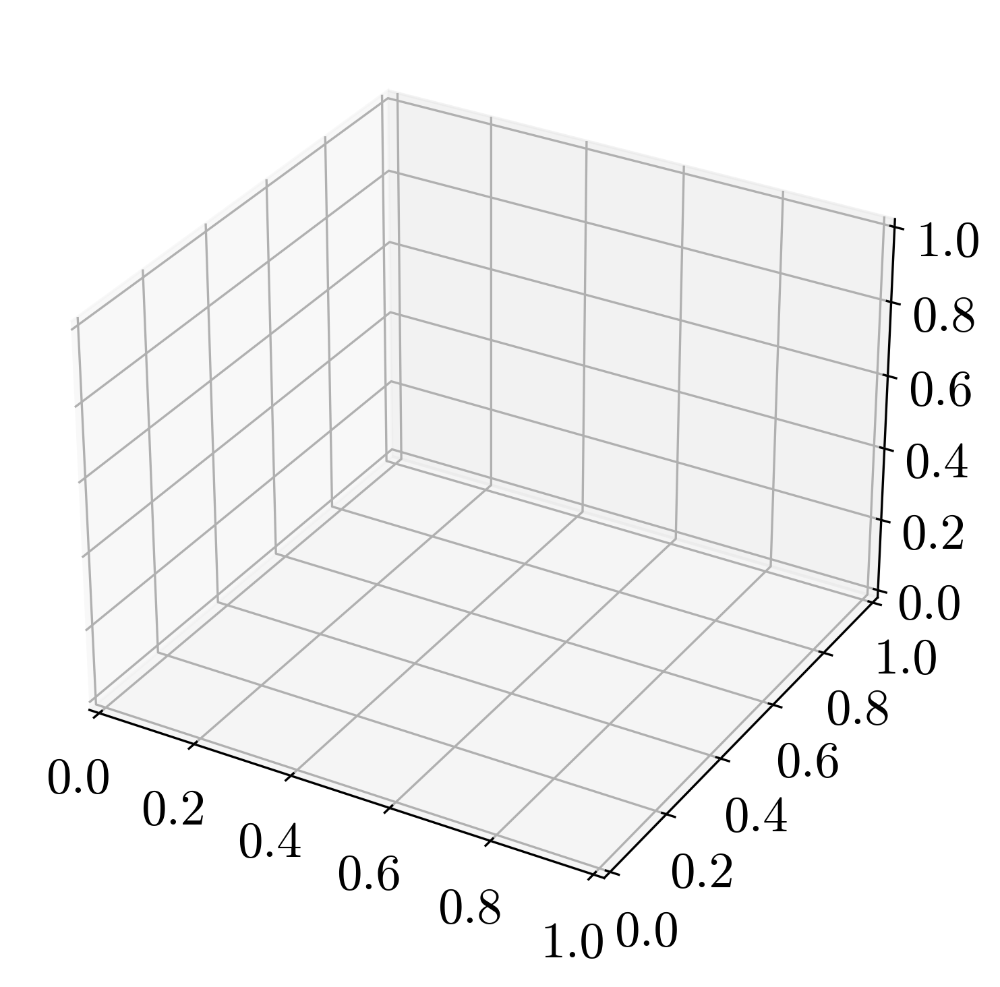

In [164]:
fig, ax = plt.subplots(1, 1, subplot_kw={'projection':'3d'})
#ax.set_box_aspect([1,1,1])
#ax.set_aspect('equal')

In [151]:
#ax.scatter(data_e[:, 0], data_e[:,1], data_e[:,2], s=3, c='r', zorder=10)

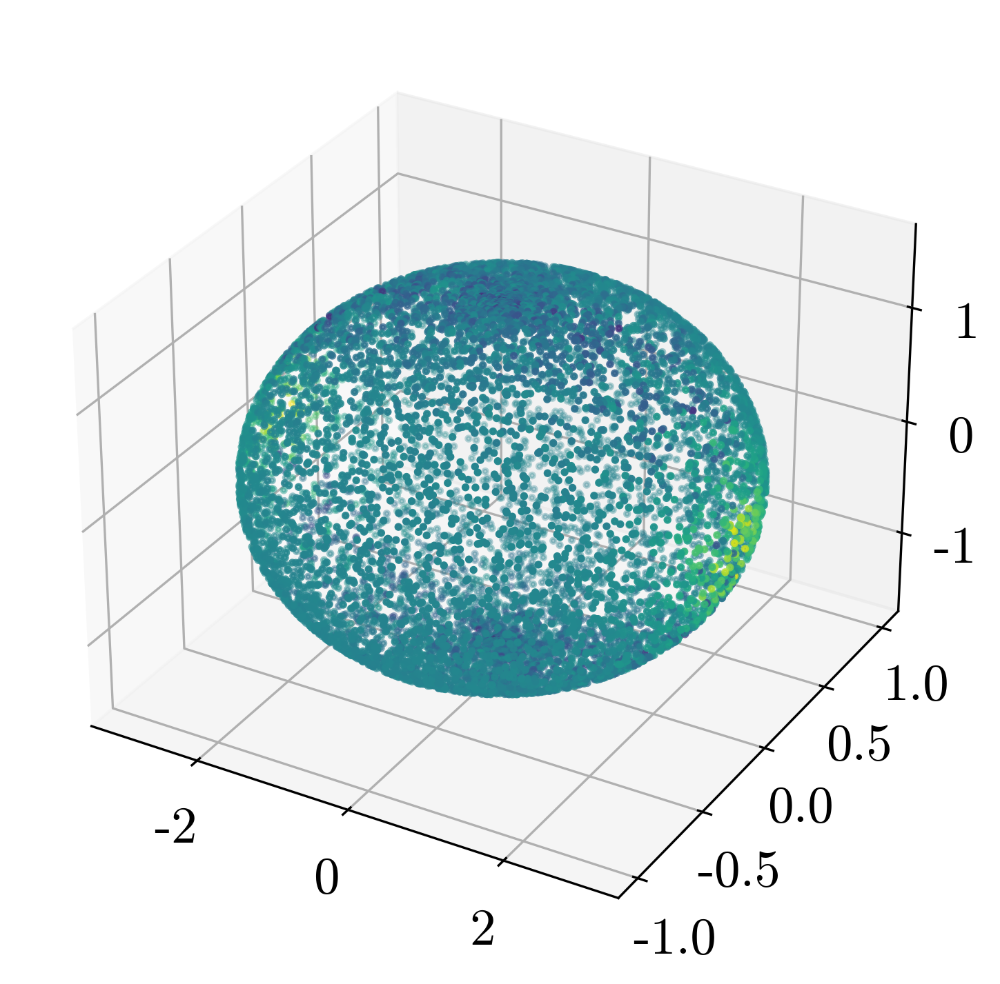

In [156]:
fig

In [141]:
e_graph = make_nearest_neighbors_graph(data_e, 40, n=npoints)

100%|██████████| 10000/10000 [00:02<00:00, 3535.81it/s]


In [143]:
_,_,_,_, e_h = get_second_fundamental_form(data_e, e_graph, 2)

100%|██████████| 10000/10000 [00:02<00:00, 3685.35it/s]


In [145]:
riem, ric, sc = get_riemannian_ricci_scalar(e_h)

In [155]:
ax.scatter(data_e[:, 0], data_e[:,1], data_e[:,2], s=3, c=sc, cmap='viridis',zorder=10)

In [223]:
dragon = np.loadtxt('dragon.txt')

In [224]:
dragon.shape

(22998, 3)

In [225]:
dragon_graph = make_nearest_neighbors_graph(dragon, 30, n=22998)

100%|██████████| 22998/22998 [00:04<00:00, 5397.50it/s]


In [226]:
_,_,_,_, dragon_h = get_second_fundamental_form(dragon, dragon_graph, 2)

100%|██████████| 22998/22998 [00:06<00:00, 3712.63it/s]


In [227]:
riem, ric, sc = get_riemannian_ricci_scalar(dragon_h)

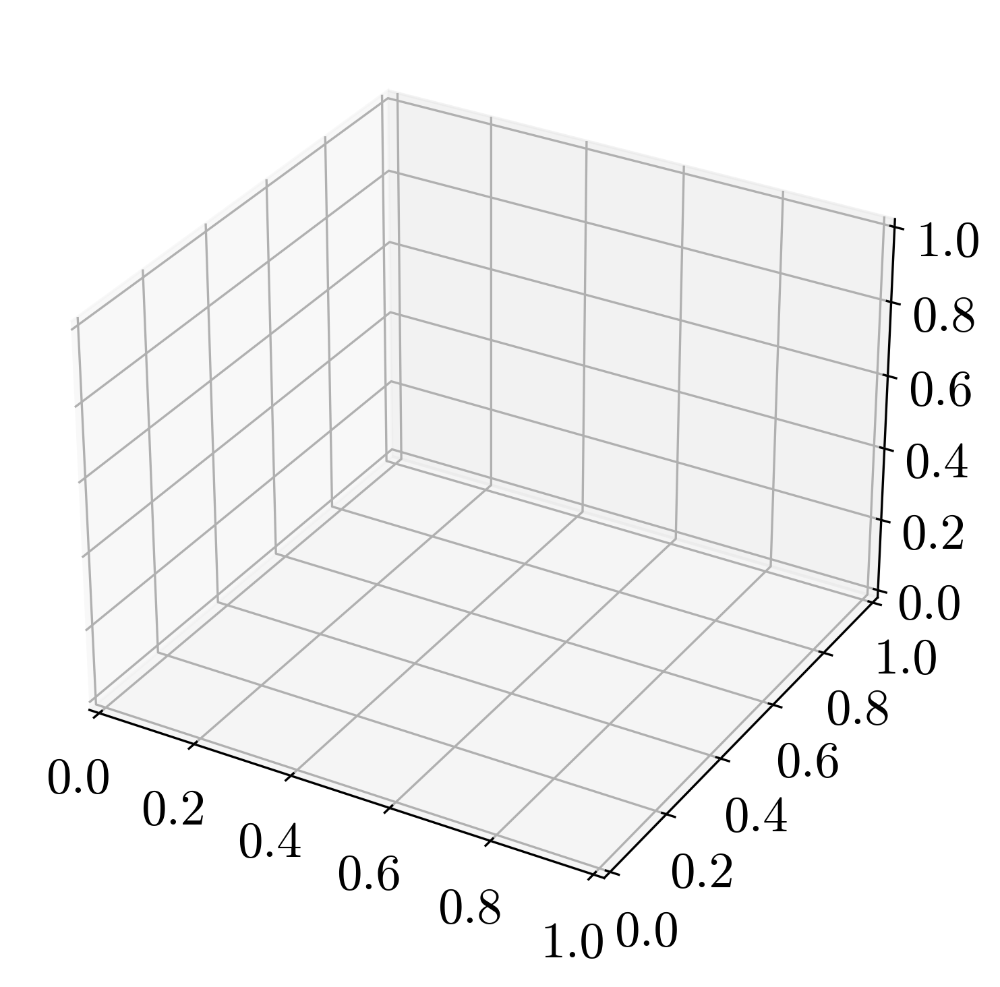

In [228]:
fig, ax = plt.subplots(1, 1, subplot_kw={'projection':'3d'})


(array([5.000e+00, 5.000e+00, 7.000e+00, 2.000e+00, 2.000e+00, 6.000e+00,
        5.000e+00, 1.000e+00, 4.000e+00, 7.000e+00, 6.000e+00, 5.000e+00,
        3.000e+00, 8.000e+00, 5.000e+00, 2.000e+00, 6.000e+00, 7.000e+00,
        1.000e+00, 3.000e+00, 5.000e+00, 5.000e+00, 3.000e+00, 8.000e+00,
        6.000e+00, 5.000e+00, 4.000e+00, 9.000e+00, 5.000e+00, 4.000e+00,
        8.000e+00, 9.000e+00, 1.000e+01, 4.000e+00, 3.000e+00, 6.000e+00,
        8.000e+00, 6.000e+00, 1.300e+01, 4.000e+00, 5.000e+00, 1.200e+01,
        6.000e+00, 9.000e+00, 4.000e+00, 7.000e+00, 1.300e+01, 1.200e+01,
        9.000e+00, 5.000e+00, 5.000e+00, 8.000e+00, 4.000e+00, 5.000e+00,
        7.000e+00, 7.000e+00, 9.000e+00, 1.100e+01, 7.000e+00, 1.000e+01,
        1.600e+01, 1.000e+01, 9.000e+00, 1.200e+01, 8.000e+00, 1.100e+01,
        8.000e+00, 1.300e+01, 1.600e+01, 1.000e+01, 1.200e+01, 1.000e+01,
        1.000e+01, 1.700e+01, 1.000e+01, 1.700e+01, 7.000e+00, 9.000e+00,
        1.100e+01, 1.500e+01, 1.000e+0

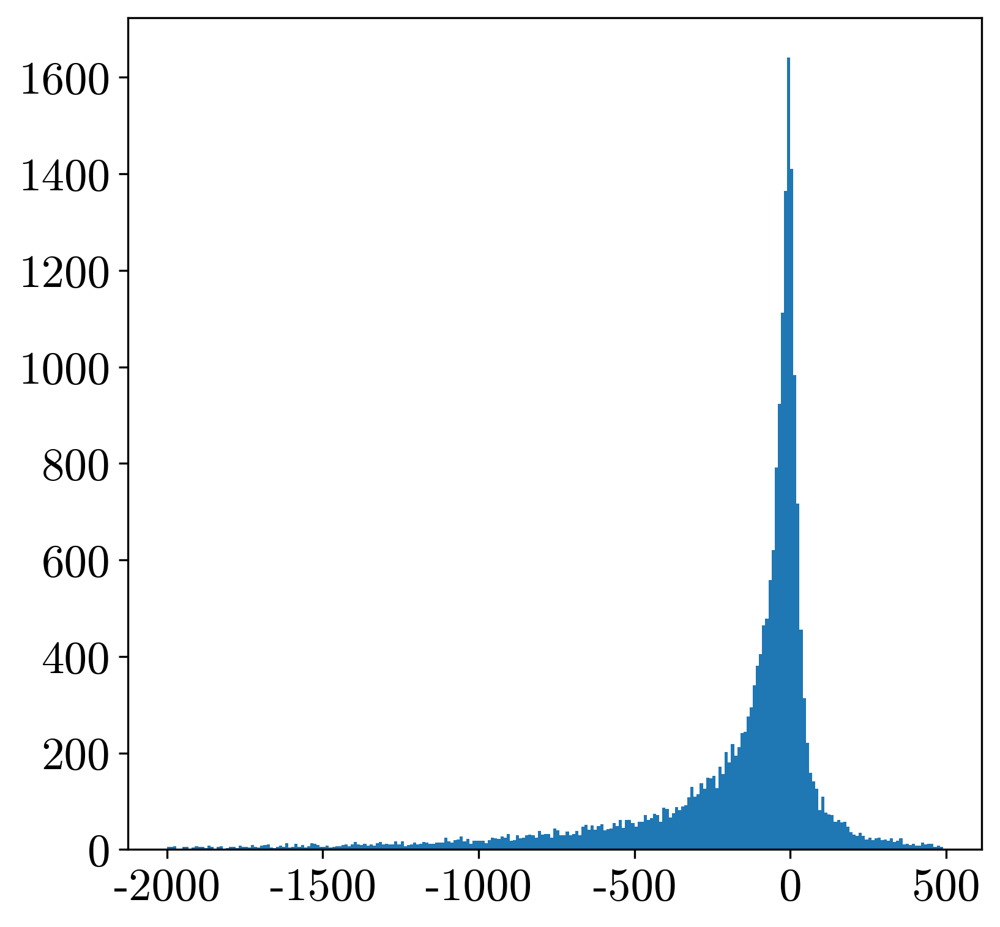

In [231]:
plt.hist(sc,bins=np.arange(-2000,500,10))

In [232]:
ax.scatter(dragon[:,1], dragon[:, 0], dragon[:,2], s=1, c=sc, cmap='viridis',zorder=10,norm = mpl.colors.Normalize(vmin=-500, vmax=100, clip=True), alpha=0.5)

In [ ]:
fig

In [157]:
vase = np.loadtxt('vase.txt')

In [158]:
vase.shape

(10692, 3)

In [185]:
vase_graph = make_nearest_neighbors_graph(vase, 60, n=10692)

100%|██████████| 10692/10692 [00:03<00:00, 2712.76it/s]


In [198]:
_,_,_,_, vase_h = get_second_fundamental_form(vase, vase_graph, 2)

100%|██████████| 10692/10692 [00:02<00:00, 3572.74it/s]


In [199]:
riem, ric, sc = get_riemannian_ricci_scalar(vase_h)

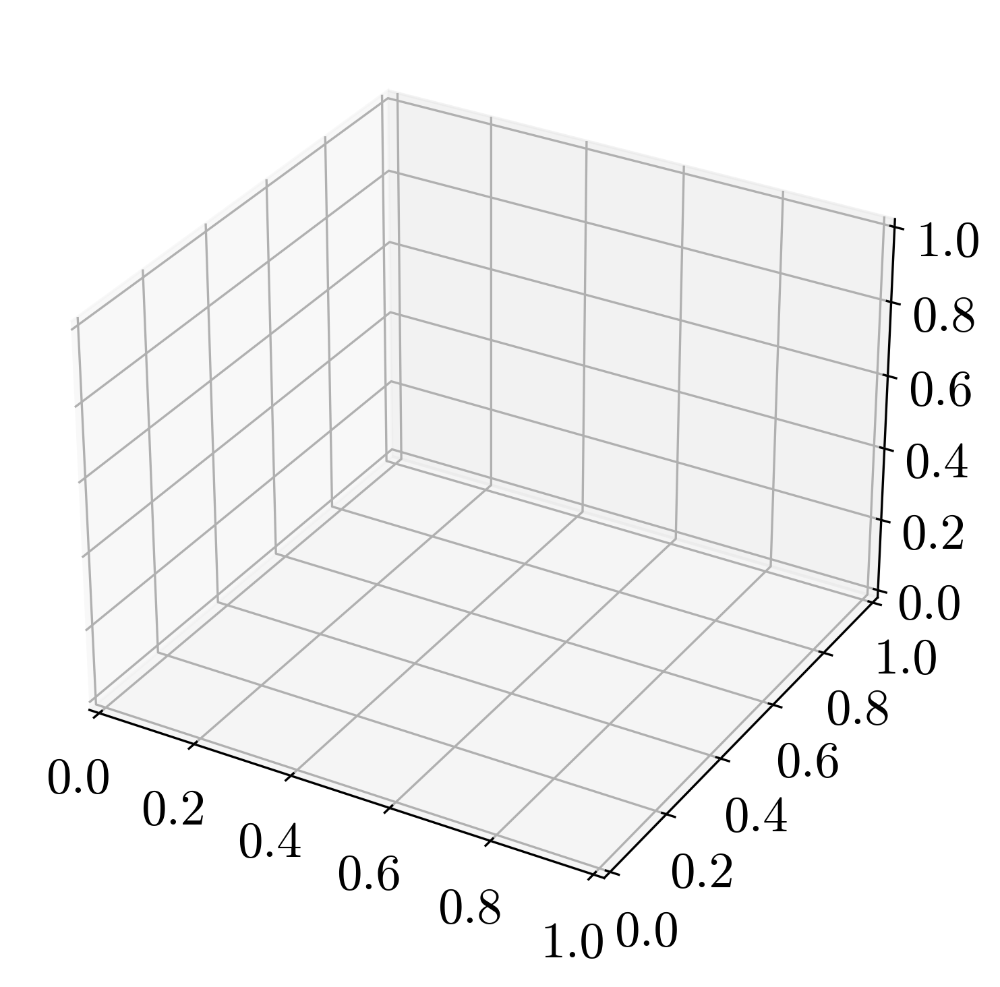

In [219]:
fig, ax = plt.subplots(1, 1, subplot_kw={'projection':'3d'})


In [220]:
ax.scatter(vase[:,1], vase[:, 0], vase[:,2], s=1, c=sc, cmap='viridis',zorder=10,norm = mpl.colors.Normalize(vmin=-30, vmax=30, clip=True), alpha=0.5)

(array([1.000e+00, 6.000e+00, 9.000e+00, 2.400e+01, 1.250e+02, 6.370e+02,
        9.642e+03, 2.050e+02, 3.600e+01, 7.000e+00]),
 array([-520.92702515, -441.35379664, -361.78056813, -282.20733962,
        -202.63411111, -123.0608826 ,  -43.48765409,   36.08557441,
         115.65880292,  195.23203143,  274.80525994]),
 <BarContainer object of 10 artists>)

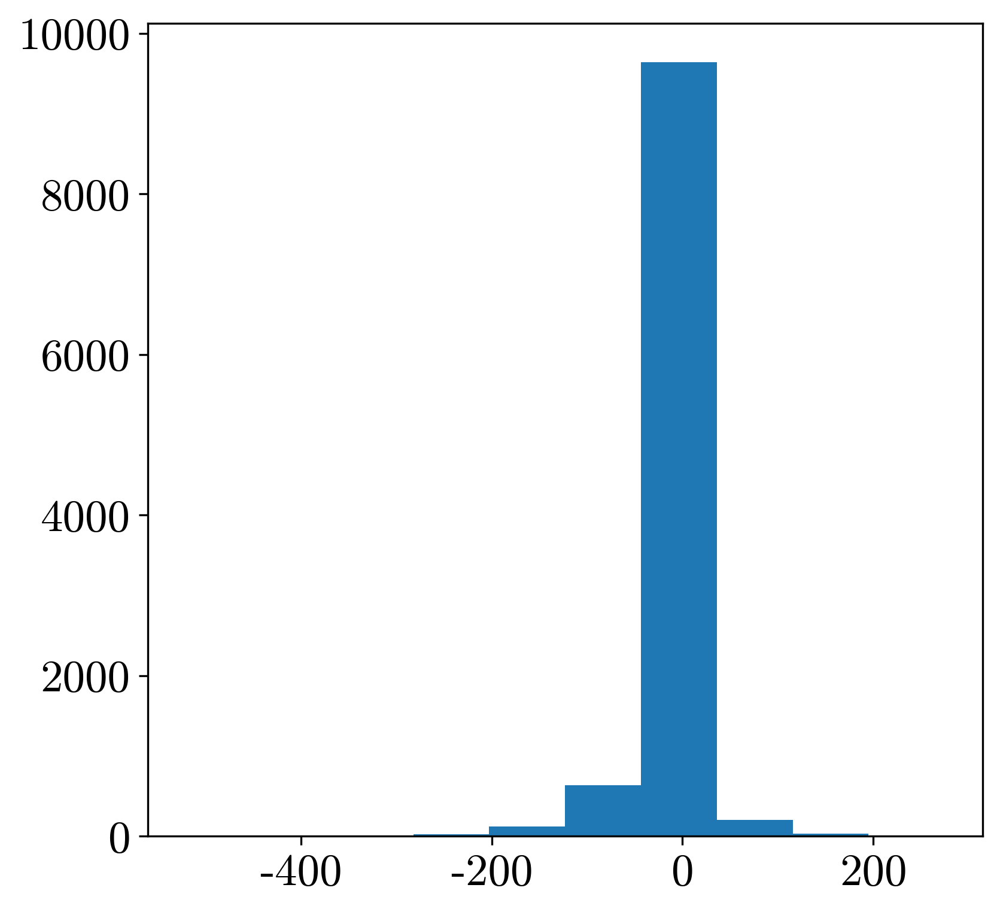

In [221]:
plt.hist(sc)

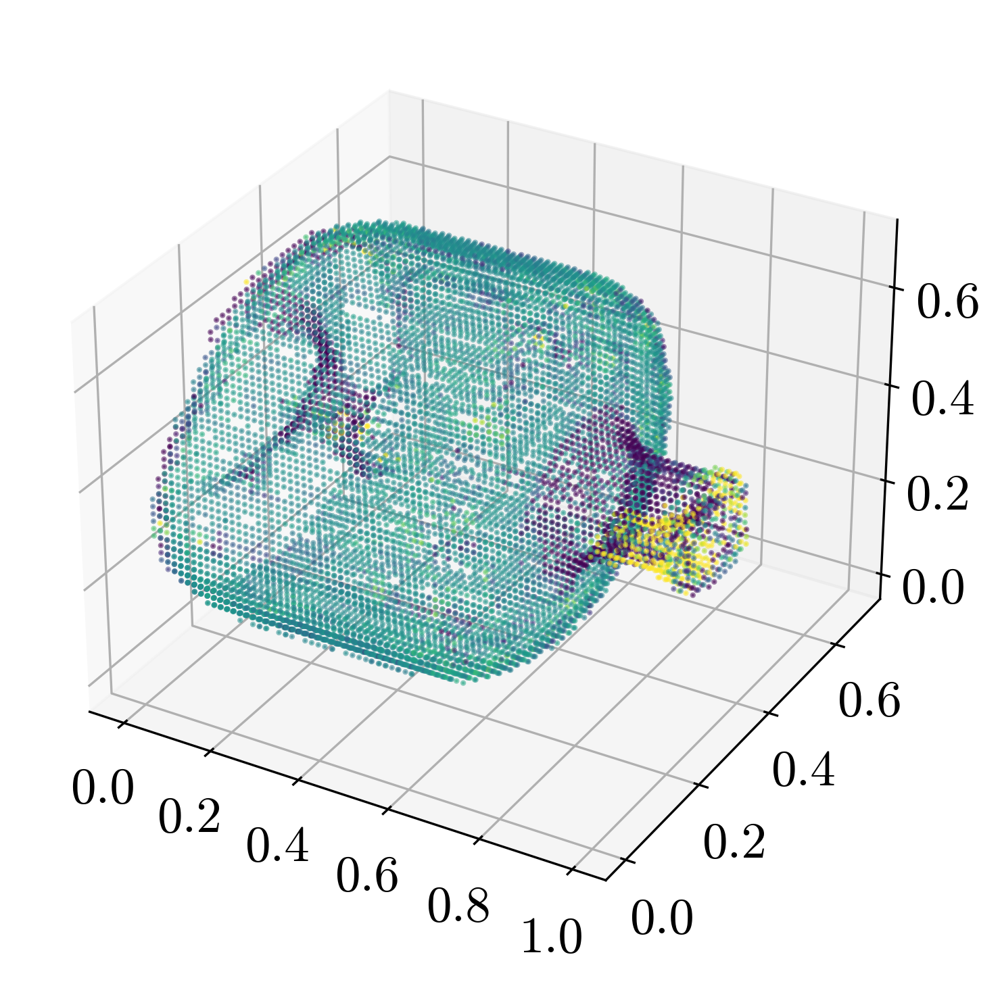

In [222]:
fig

In [56]:
data_t = sample_torus(10000,2,1)

In [57]:
t_graph = make_nearest_neighbors_graph(data_t, 40, n=npoints)

100%|██████████| 10000/10000 [00:02<00:00, 3834.19it/s]


In [58]:
_, _, _, _, t_h = get_second_fundamental_form(data_t, t_graph, 2)

100%|██████████| 10000/10000 [00:02<00:00, 3660.25it/s]


In [116]:
verts = np.load('bunny.npy')

verts*=1000

bunny_graph = make_nearest_neighbors_graph(verts, 6, n=14904)

_,_,_,_, bunny_h = get_second_fundamental_form(verts, bunny_graph, 2)

100%|██████████| 14904/14904 [00:03<00:00, 3970.38it/s]


In [124]:
riem, ric, sc = get_riemannian_ricci_scalar(t_h)

In [125]:
weitzenbock = get_weitzenbock_operator(riem, 2, 2)

In [126]:
eigvals = np.empty((0,2**2))
for row in weitzenbock:
    eigvals = np.vstack([eigvals, np.linalg.eigvals(row)])

In [127]:
eigvals

array([[ 2.78297812e-02+0.j, -3.08972638e-18+0.j,  2.78297812e-02+0.j,
        -3.08972638e-18+0.j],
       [-2.22044605e-16+0.j, -2.69077722e+00+0.j, -2.22044605e-16+0.j,
        -2.69077722e+00+0.j],
       [-5.55111512e-17+0.j, -8.60000141e-01+0.j, -5.55111512e-17+0.j,
        -8.60000141e-01+0.j],
       ...,
       [ 0.00000000e+00+0.j, -8.55448248e-01+0.j,  0.00000000e+00+0.j,
        -8.55448248e-01+0.j],
       [ 5.55111512e-17+0.j, -5.70723019e-01+0.j,  5.55111512e-17+0.j,
        -5.70723019e-01+0.j],
       [ 0.00000000e+00+0.j, -2.88487548e-01+0.j,  0.00000000e+00+0.j,
        -2.88487548e-01+0.j]])

In [128]:
sorted_eig = np.sort(eigvals.real.reshape(1,-1)).flatten()

In [129]:
sorted_eig[:]

array([-4.03216526, -4.03216526, -4.0183487 , ...,  0.42613698,
        0.43237518,  0.43237518])

(array([  652.,   844.,  1168.,  1964.,  3144., 11743., 19843.,     0.,
            0.,     0.,     0.]),
 array([-3. , -2.5, -2. , -1.5, -1. , -0.5,  0. ,  0.5,  1. ,  1.5,  2. ,
         2.5]),
 <BarContainer object of 11 artists>)

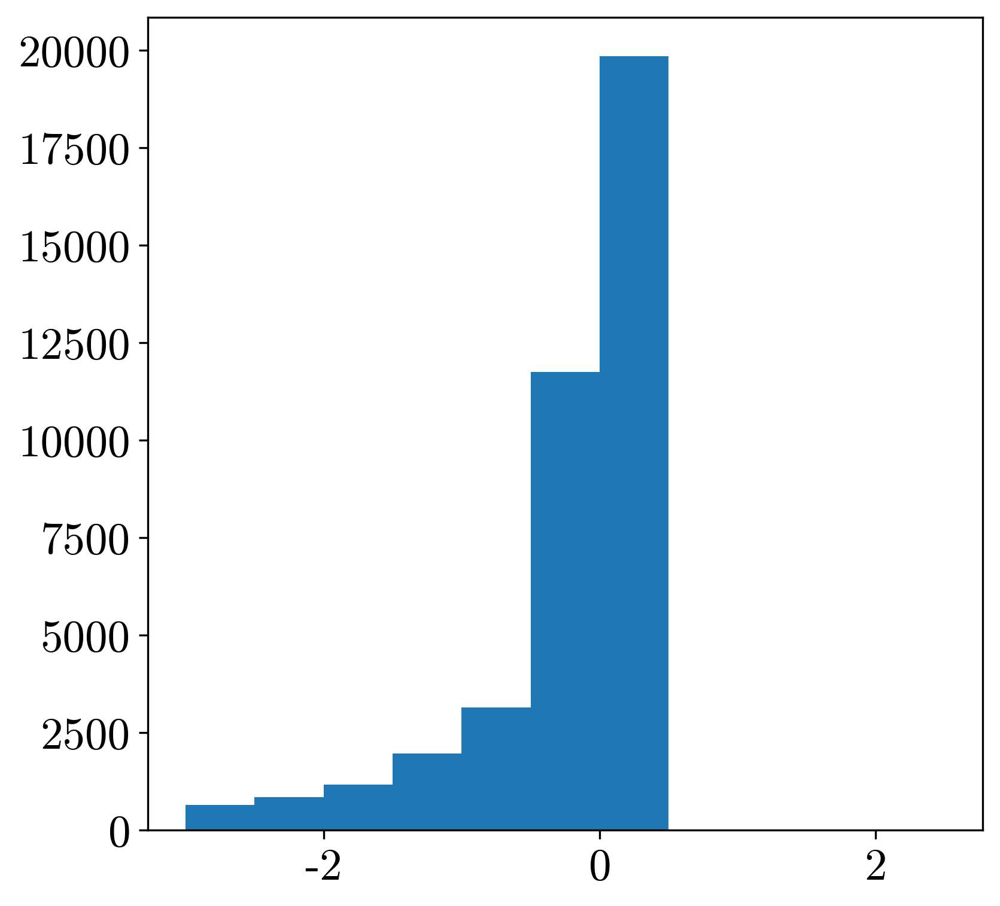

In [131]:
plt.hist(sorted_eig, bins = np.arange(-3,3,0.5))

In [48]:
riem, ric, sc = get_riemannian_ricci_scalar(s2_h)

In [49]:
weitzenbock = get_weitzenbock_operator(riem, 2, 2)

In [51]:
eigvals = np.empty((0,2**2))
for row in weitzenbock:
    eigvals = np.vstack([eigvals, np.linalg.eigvals(row)])

In [52]:
sorted_eig = np.sort(eigvals.real.reshape(1,-1)).flatten()

(array([    0.,     0.,     0.,     0.,    64., 27124., 12812.,     0.,
            0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,     0.,     0.]),
 array([-1.00000000e+00, -8.00000000e-01, -6.00000000e-01, -4.00000000e-01,
        -2.00000000e-01, -2.22044605e-16,  2.00000000e-01,  4.00000000e-01,
         6.00000000e-01,  8.00000000e-01,  1.00000000e+00,  1.20000000e+00,
         1.40000000e+00,  1.60000000e+00,  1.80000000e+00,  2.00000000e+00,
         2.20000000e+00,  2.40000000e+00,  2.60000000e+00,  2.80000000e+00]),
 <BarContainer object of 19 artists>)

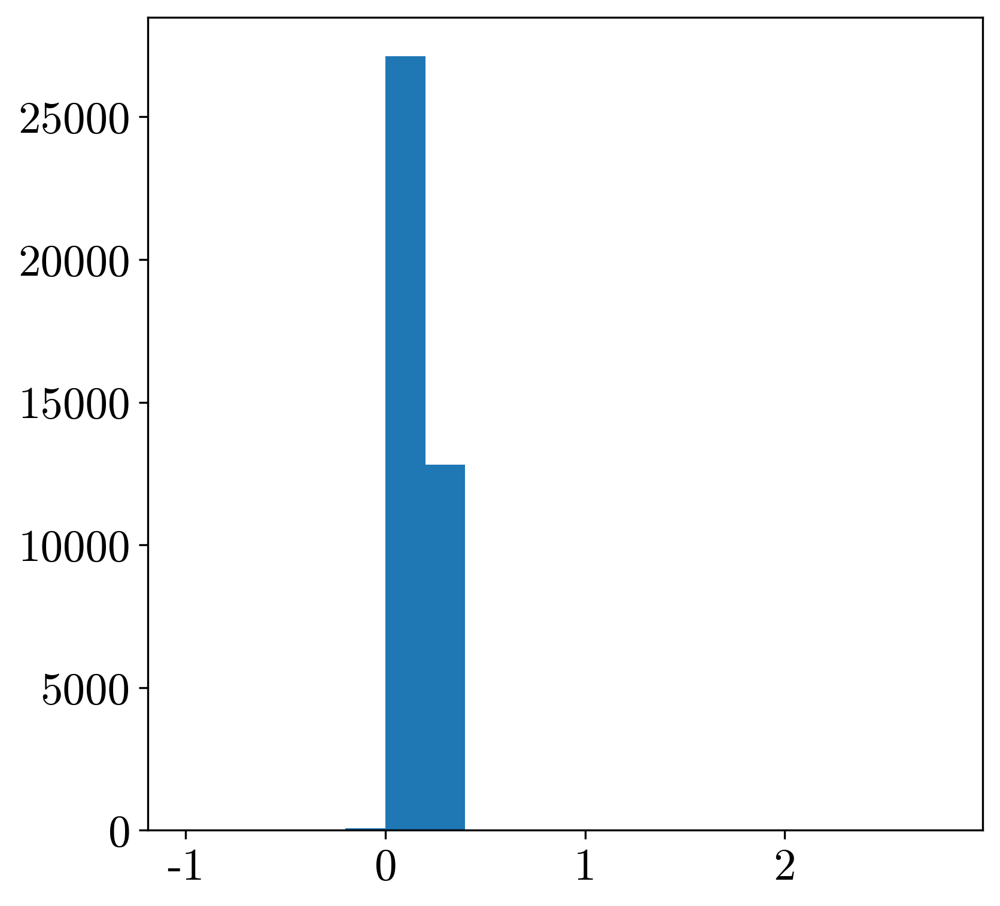

In [53]:
plt.hist(sorted_eig, bins = np.arange(-1,3,0.2))

In [14]:
Riem = np.einsum('nika,njla->nijkl',s2_h,s2_h) - np.einsum('nila,njka->nijkl',s2_h,s2_h)

In [15]:
Scalar = np.einsum('nijij->n', Riem)

In [16]:
Ric = np.einsum('nikjk->nij', Riem)

In [17]:
Riem_factor1 = np.einsum('nijkl->nji',Riem)
Riem_factor2 = np.einsum('nijkl->nlk',Riem)

#Riem_factor2

In [18]:
Riem.shape

(10000, 2, 2, 2, 2)

In [19]:
# tensor rank p 
p = 4
#manifold dim k
k = 2
riemannian_factor = np.zeros((npoints, k**p, k**p))

In [20]:
triplet = []
for i in range(p+1-2):
    for j in range(p+1-i-2):
        triplet.append([i,j,p-2-(i+j)])

In [21]:
triplet

[[0, 0, 2], [0, 1, 1], [0, 2, 0], [1, 0, 1], [1, 1, 0], [2, 0, 0]]

In [22]:
riemannian_factor = np.zeros((npoints, k**p, k**p))
for left, middle, right in triplet:
    Ileft, Iright = 1, 1
    if left != 0:
        Ileft = np.eye(k**left)
    if right != 0:
        Iright = np.eye(k**right)
    
    if middle != 0:
        Imiddle  = np.eye(k**middle)
        Rmiddle = np.einsum('nijkl,ab-> njalibk', Riem, Imiddle)
        Rmiddle = Rmiddle.reshape(npoints, 4*(k**middle),4*(k**middle))
    elif middle == 0:
        Rmiddle = np.einsum('nijkl->njlik', Riem)
        Rmiddle = Rmiddle.reshape(npoints, 4,4)
    
    riemannian_factor += np.kron(np.kron(Ileft, Rmiddle),Iright)

In [23]:
riemannian_factor.shape

(10000, 16, 16)

In [24]:
ricci_factor = np.zeros((npoints, k**p, k**p))
for i in range(p):
    left = i 
    right = p-1-i
    Ileft, Iright = 1, 1
    if left != 0 and right==0:
        Ileft = np.eye(k**left)
        mult = np.einsum('ab,nij->naibj',Ileft, Ric).reshape(npoints,k**p, k**p)
    elif right != 0 and left==0:
        Iright = np.eye(k**right)
        mult = np.einsum('nij,cd->nicjd', Ric,Iright).reshape(npoints,k**p, k**p)
    elif left != 0 and right !=0:
        Ileft = np.eye(k**left)
        Iright = np.eye(k**right)
        mult = np.einsum('ab,nij,cd->naicbjd',Ileft, Ric, Iright).reshape(npoints,k**p, k**p)
    ricci_factor += mult

In [25]:
weitzenbock = ricci_factor - 2* riemannian_factor

In [26]:
weitzenbock.shape

(10000, 16, 16)

In [27]:
eigvals = np.empty((0,16))
for row in weitzenbock:
    eigvals = np.vstack([eigvals, np.linalg.eigvals(row)])

In [28]:
eigvals

array([[ 9.42065733e-01+0.j,  2.35516433e-01+0.j,  3.14739446e-17+0.j,
        ...,  2.35516433e-01+0.j,  2.35516433e-01+0.j,
         2.35516433e-01+0.j],
       [ 5.31982490e-01+0.j,  1.32995623e-01+0.j,  2.26021490e-17+0.j,
        ..., -8.82337861e-18+0.j,  1.32995623e-01+0.j,
         1.32995623e-01+0.j],
       [ 9.81556689e-01+0.j,  2.45389172e-01+0.j,  2.99091619e-17+0.j,
        ...,  2.45389172e-01+0.j,  2.45389172e-01+0.j,
         2.45389172e-01+0.j],
       ...,
       [ 7.12838255e-01+0.j,  1.78209564e-01+0.j,  3.11966221e-17+0.j,
        ...,  1.78209564e-01+0.j,  1.78209564e-01+0.j,
         1.78209564e-01+0.j],
       [ 8.77078615e-01+0.j,  2.19269654e-01+0.j,  3.87967866e-17+0.j,
        ...,  2.19269654e-01+0.j,  2.19269654e-01+0.j,
         2.19269654e-01+0.j],
       [ 7.28615952e-01+0.j,  1.82153988e-01+0.j,  4.44414144e-17+0.j,
        ...,  5.67131100e-18+0.j,  1.82153988e-01+0.j,
         1.82153988e-01+0.j]])

In [30]:
sorted_eig = np.sort(eigvals.real.reshape(1,-1)).flatten()

In [ ]:
sorted_eig = sorted_eig.flatten()

(array([0.0000e+00, 0.0000e+00, 8.0000e+00, 1.0000e+01, 3.0900e+02,
        8.8653e+04, 5.1814e+04, 1.8020e+03, 4.5920e+03, 1.0302e+04,
        2.5060e+03, 4.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]),
 array([-1.00000000e+00, -8.00000000e-01, -6.00000000e-01, -4.00000000e-01,
        -2.00000000e-01, -2.22044605e-16,  2.00000000e-01,  4.00000000e-01,
         6.00000000e-01,  8.00000000e-01,  1.00000000e+00,  1.20000000e+00,
         1.40000000e+00,  1.60000000e+00,  1.80000000e+00,  2.00000000e+00,
         2.20000000e+00,  2.40000000e+00,  2.60000000e+00,  2.80000000e+00]),
 <BarContainer object of 19 artists>)

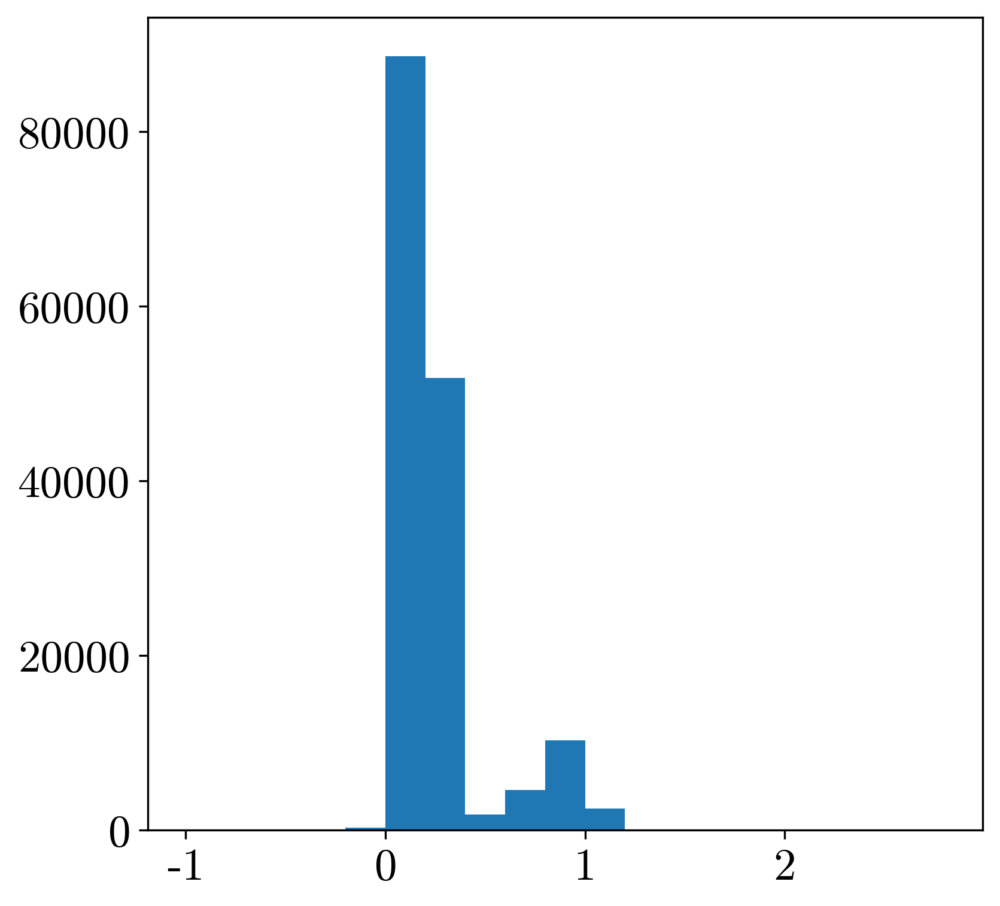

In [45]:
plt.hist(sorted_eig, bins = np.arange(-1,3,0.2))

In [ ]:
sorted_eig = sorted_eig.flatten()

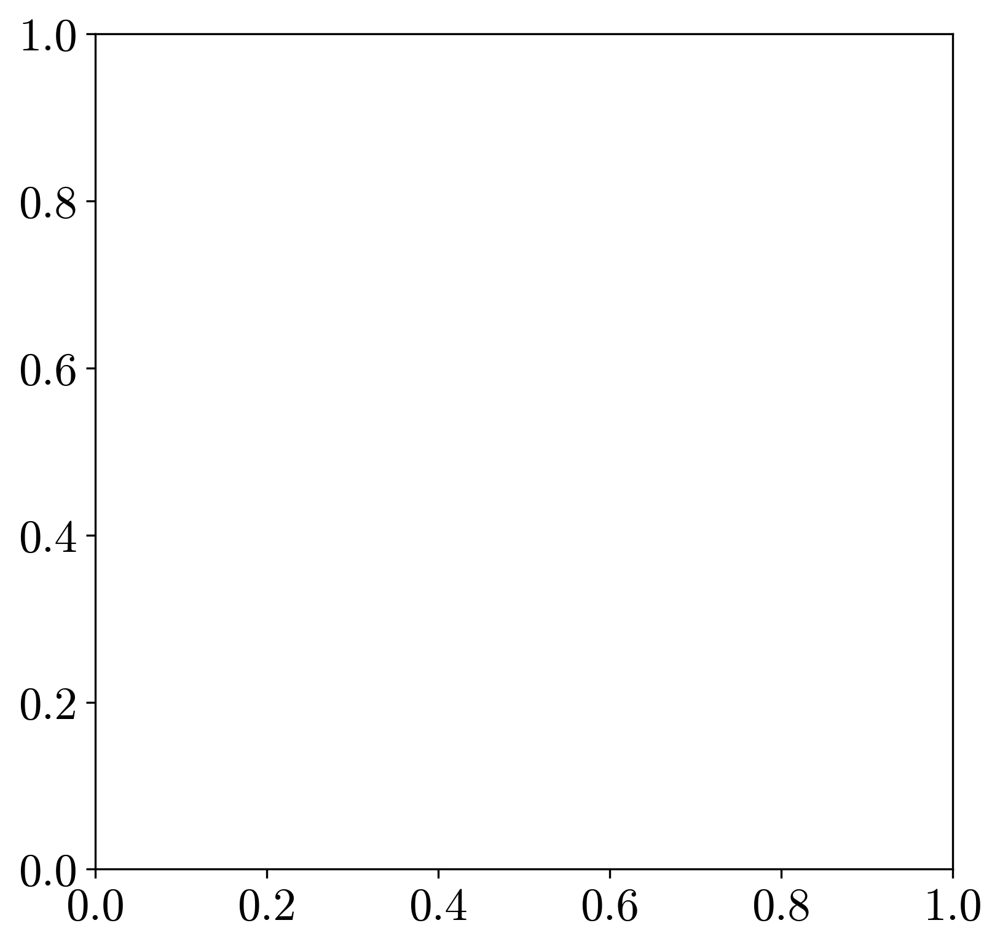

In [37]:
f, ax = plt.subplots()


In [38]:
ax.hist(sorted_eig[:1000])

(array([  2.,   0.,   4.,   4.,   4.,   4.,   2.,  22.,  80., 878.]),
 array([-5.82306531e-01, -5.24075878e-01, -4.65845225e-01, -4.07614572e-01,
        -3.49383919e-01, -2.91153265e-01, -2.32922612e-01, -1.74691959e-01,
        -1.16461306e-01, -5.82306531e-02, -9.19803960e-17]),
 <BarContainer object of 10 artists>)

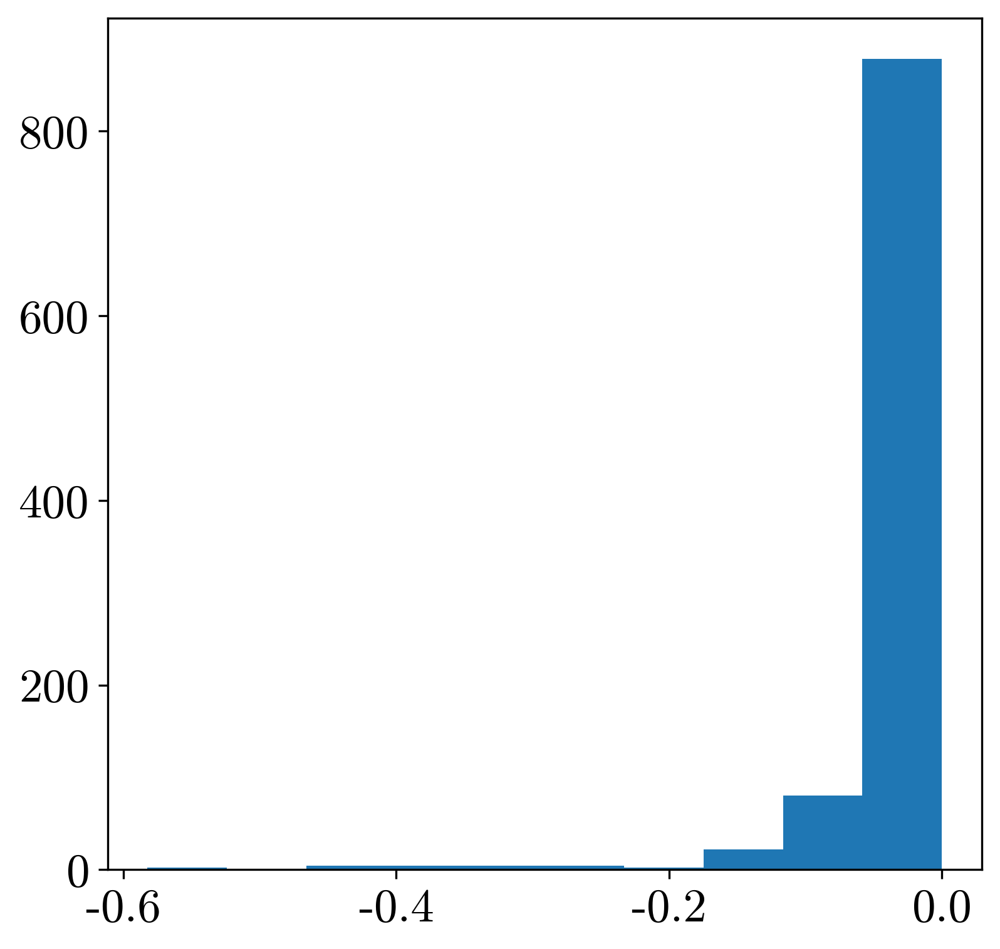

In [39]:
f

In [ ]:
plt.hist(sorted_eig)

(array([[1., 0., 0., ..., 0., 0., 0.],
        [1., 0., 0., ..., 0., 0., 0.],
        [1., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 1.],
        [0., 0., 0., ..., 0., 0., 1.],
        [0., 0., 0., ..., 0., 0., 1.]]),
 array([-0.449299  , -0.32948593, -0.20967287, -0.0898598 ,  0.02995327,
         0.14976633,  0.2695794 ,  0.38939246,  0.50920553,  0.6290186 ,
         0.74883166]),
 <a list of 160000 BarContainer objects>)

In [42]:
eigvals

array([], dtype=float64)

In [21]:
ricci_factor_2 = ricci_factor

In [22]:

ricci_factor = np.zeros((npoints, k**p, k**p))
for index in range(npoints):
    for i in range(p):
        kron = 1
        for j in range(p):
            if j==i:
                mult = Ric[index]
            else:
                mult = np.eye(k)
            kron = np.kron(kron, mult)
        ricci_factor[index] += kron

In [26]:
np.array_equal(ricci_factor, ricci_factor_2)

True

In [23]:
ricci_factor

array([[[0.23586864, 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.23586864, 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.23586864, ..., 0.        ,
         0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.23586864,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.23586864, 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.23586864]],

       [[0.25467105, 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.25467105, 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.25467105, ..., 0.        ,
         0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.25467105,
         0.        , 0.        ],
        [0. 

In [42]:
ricci_factor.shape

(20000, 16, 16)

In [21]:
np.choose(np.arange(0,9),2)

TypeError: 'int' object is not iterable

In [122]:
A = np.arange(3,7).reshape(2,2)

In [123]:
res = np.kron(np.kron(A,A),A)

In [124]:
res

array([[ 27,  36,  36,  48,  36,  48,  48,  64],
       [ 45,  54,  60,  72,  60,  72,  80,  96],
       [ 45,  60,  54,  72,  60,  80,  72,  96],
       [ 75,  90,  90, 108, 100, 120, 120, 144],
       [ 45,  60,  60,  80,  54,  72,  72,  96],
       [ 75,  90, 100, 120,  90, 108, 120, 144],
       [ 75, 100,  90, 120,  90, 120, 108, 144],
       [125, 150, 150, 180, 150, 180, 180, 216]])

In [131]:
test1 = np.einsum('ij,kl,nm->iknjlm',A,A,A)

In [133]:
test1.reshape(8,8) == res

array([[ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True]])

In [117]:
sum(Scalar)

2035.1473077050898

In [118]:
np.mean(Scalar)

0.1017573653852553

In [ ]:
Scalar[:100]

In [105]:
max(Scalar)

0.6185534067885142

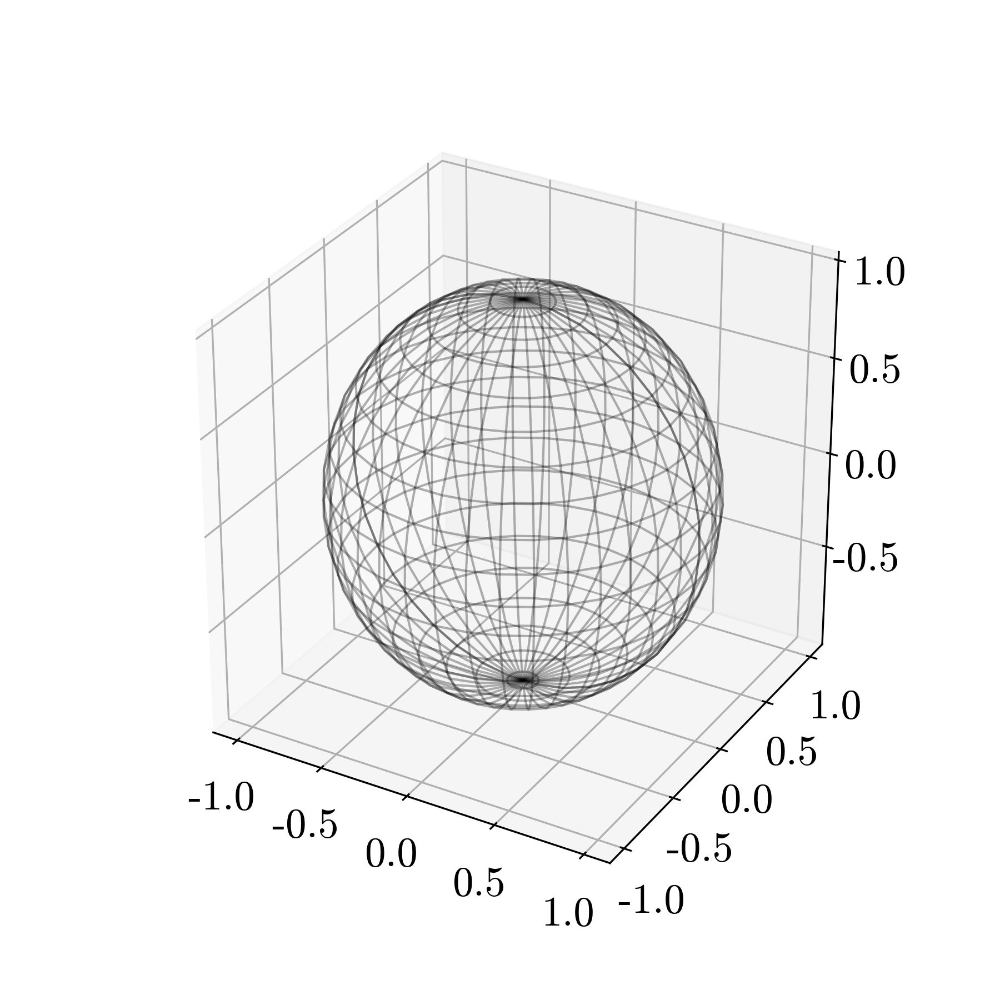

In [106]:
fig, ax = visualize_grid_sphere()

In [107]:
ax.scatter(data_s2[:, 0], data_s2[:,1], data_s2[:,2], s=3, c=Scalar, cmap='viridis',zorder=10)

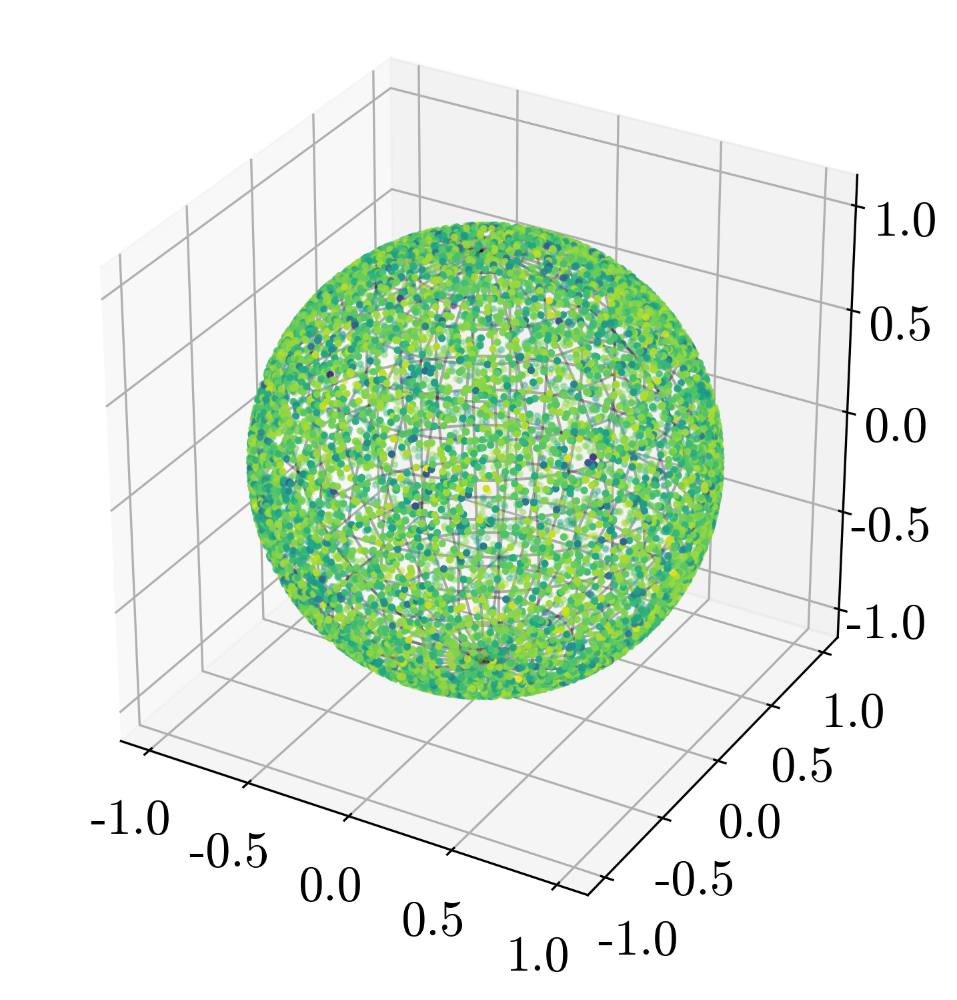

In [25]:
fig

In [126]:
s2triu.shape

(10000, 3, 1)

In [127]:
s2triu[0]

array([[-0.50282705],
       [ 0.00310191],
       [-0.4859265 ]], dtype=float32)

In [128]:
s2_h[0]

array([[[-0.50282705],
        [ 0.00310191]],

       [[ 0.00310191],
        [-0.48592651]]])

In [129]:
s2_h[1]

array([[[-0.39489773],
        [-0.10009973]],

       [[-0.10009973],
        [-0.42433232]]])

In [130]:
np.einsum('njka,nila->nijkl',s2_h,s2_h).shape

(10000, 2, 2, 2, 2)

In [111]:
np.einsum('njia,nkla->nijkl',s2_h,s2_h).shape

(10000, 2, 2, 2, 2)

In [135]:
Riem = np.einsum('njka,nila->nijkl',s2_h,s2_h) - np.einsum('njia,nkla->nijkl',s2_h,s2_h)

In [136]:
Riem.shape

(10000, 2, 2, 2, 2)

In [138]:
Ric = np.einsum('nikjk->nij',Riem)

In [143]:
Ric[2]

array([[0., 0.],
       [0., 0.]])

In [115]:
Scalar = np.einsum('nijij->n', Riem)

In [116]:
Scalar

array([0., 0., 0., ..., 0., 0., 0.])

In [19]:
data_t = sample_torus(npoints,2,1)

t_graph = make_nearest_neighbors_graph(data_t, 20, n=npoints)

100%|██████████| 20000/20000 [00:02<00:00, 7106.90it/s]


In [20]:
_,_,_,_, t_h = get_second_fundamental_form(data_t, t_graph, 2)

100%|██████████| 20000/20000 [00:05<00:00, 3808.64it/s]


In [21]:
#Riem = np.einsum('nika,njla->nijkl',s2_h,s2_h) - np.einsum('nila,njka->nijkl',s2_h,s2_h)

In [27]:
Riem_t = np.einsum('nika,njla->nijkl',t_h,t_h) - np.einsum('nila,njka->nijkl',t_h,t_h)

Scalar_t = np.einsum('nijij->n', Riem_t)

In [28]:
Scalar_t

array([-0.42708962, -0.49299812, -0.42070689, ..., -0.18177003,
       -1.83799546, -0.06479044])

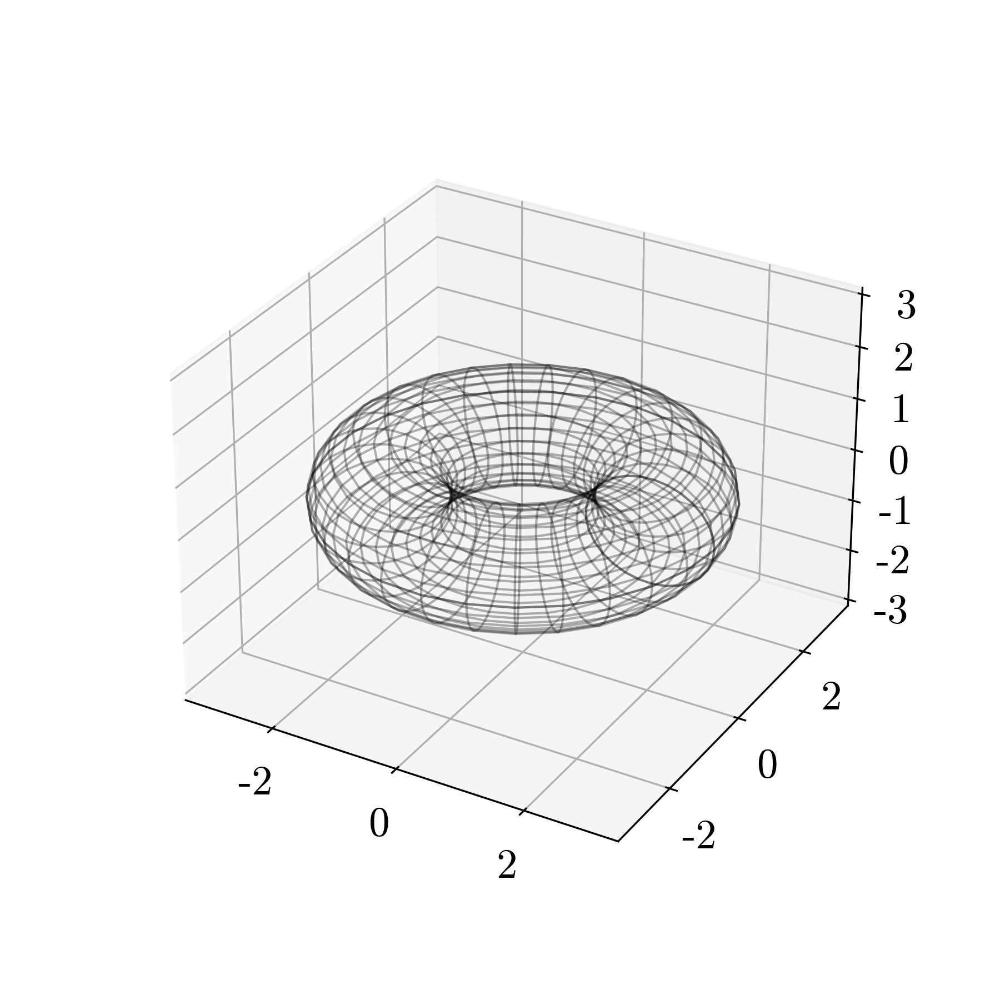

In [34]:
fig, ax = visualize_grid_torus(30,2,1)

In [35]:
min(Scalar_t)

-2.086184999881399

In [36]:
max(Scalar_t)

0.4866889742904278

In [37]:
ax.scatter(data_t[:, 0], data_t[:,1], data_t[:,2], s=3, c=Scalar_t, cmap='viridis',zorder=10,norm = mpl.colors.Normalize(vmin=-2, vmax=0.4, clip=True), alpha=0.5)

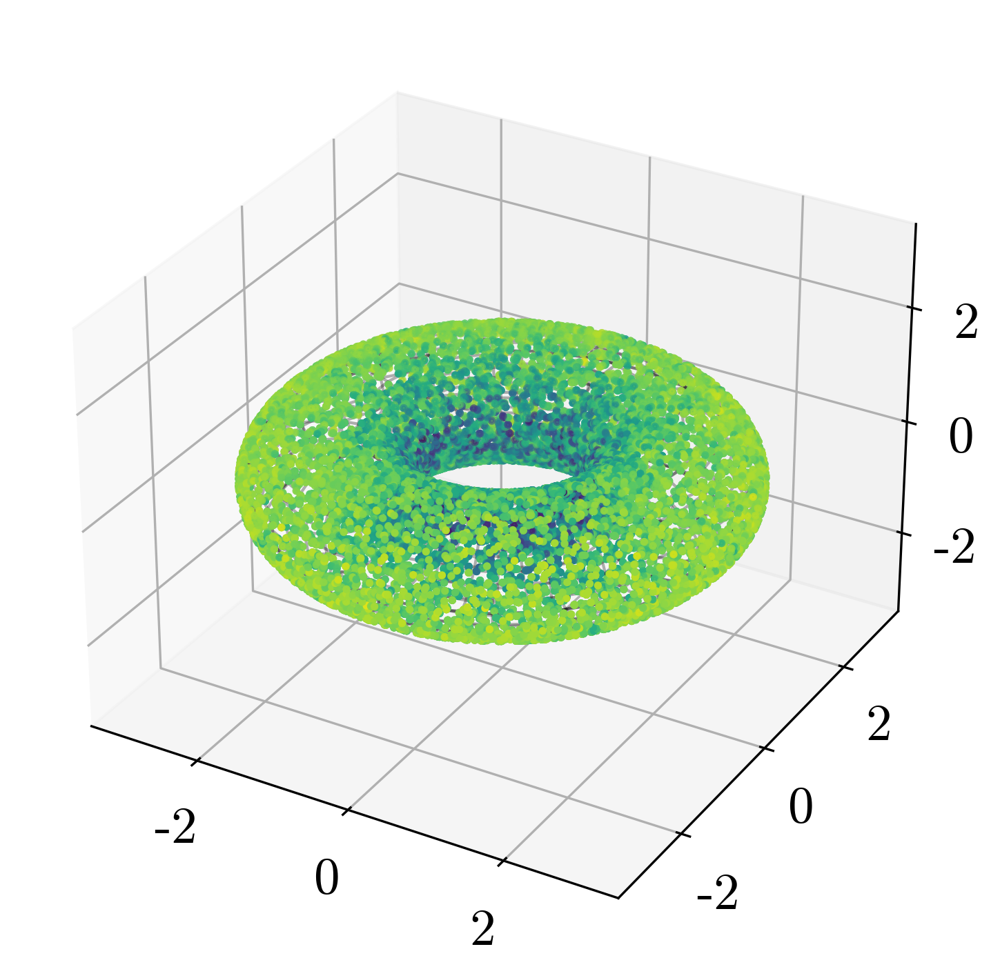

In [69]:
fig

In [42]:
npoints

10000

In [68]:
verts = np.load('bunny.npy')

verts*=100

bunny_graph = make_nearest_neighbors_graph(verts, 20, n=14904)

_,_,_,_, bunny_h = get_second_fundamental_form(verts, bunny_graph, 2)

In [45]:
Riem_bunny = np.einsum('nika,njla->nijkl',bunny_h,bunny_h) - np.einsum('nila,njka->nijkl',bunny_h,bunny_h)

Scalar_bunny = np.einsum('nijij->n', Riem_bunny)

In [46]:
#fig = plt.figure()
#ax = axes3d(fig)

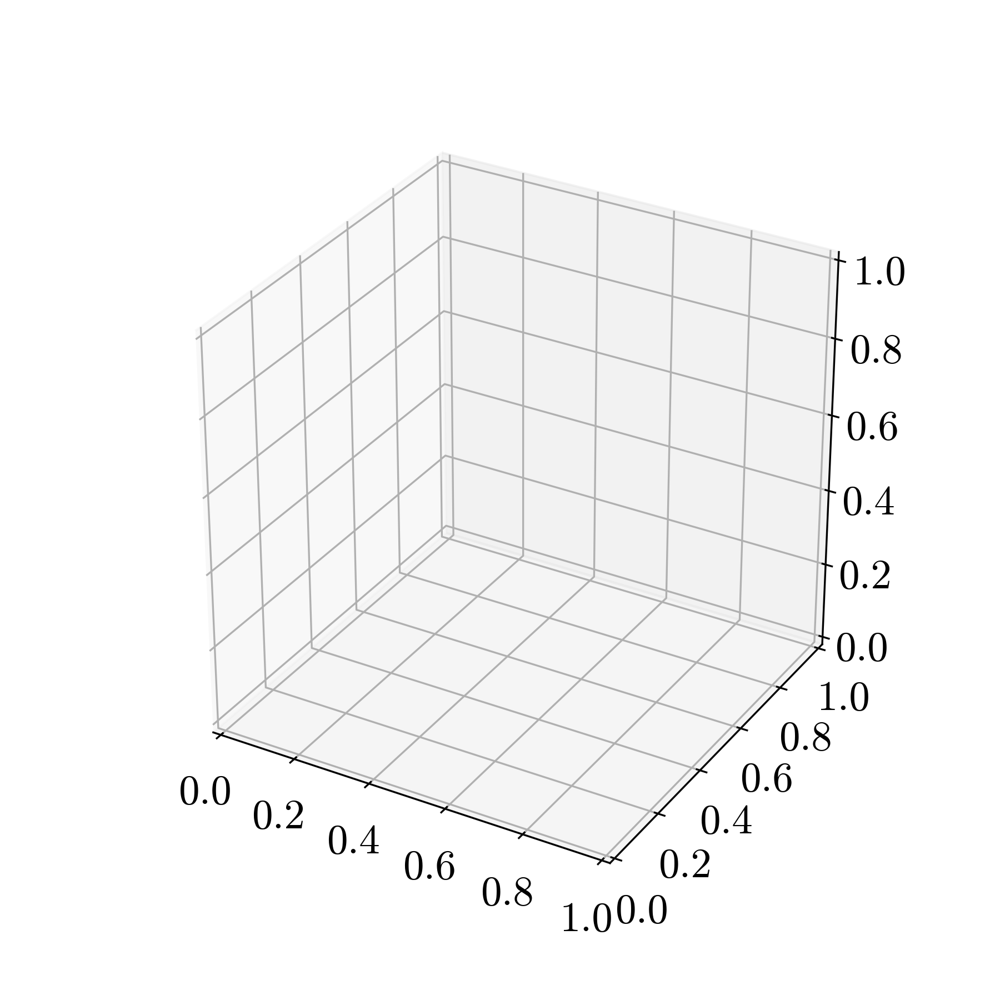

In [61]:
fig, ax = plt.subplots(1, 1, subplot_kw={'projection':'3d', 'aspect':'auto'})
ax.set_box_aspect([1,1,1])

In [62]:
ax.scatter(verts[:, 2], verts[:,0], verts[:,1], s=1, c=np.exp(Scalar_bunny), cmap='viridis',zorder=10,norm = mpl.colors.Normalize(vmin=0, vmax=10.4, clip=True))

In [48]:
Scalar_bunny[:100]

array([-8.21929914e-02, -1.97781070e-01, -4.87781167e-02, -5.96021670e-01,
       -8.57410802e-02,  5.18845618e-02, -1.27908834e-01, -2.43901783e-02,
       -8.87318810e-02, -3.91643743e-01,  1.99118072e-01, -2.78863053e-01,
       -8.87318810e-02, -1.17104219e-01, -7.47323805e-02,  3.06294864e-01,
        9.28637245e-02, -1.27389780e-01,  4.34483317e-03,  7.74740772e-03,
       -5.11163799e-03, -5.16864906e-01, -1.45056338e-01, -1.10895427e-01,
       -4.03077689e-02,  3.84956160e-02, -1.25409167e-02, -3.19148975e+00,
       -4.53384013e+00, -2.92957982e+00, -1.01780172e-01, -2.87268013e-02,
       -4.68928624e-03,  1.47551236e-01, -8.21013602e-02, -2.88219895e-01,
       -3.95195789e+00, -7.32720557e-01, -1.82434017e+00,  7.74740772e-03,
        9.40608491e-04, -4.04274221e-03,  5.46452917e-02, -4.03077689e-02,
       -1.09905618e-02, -6.68058049e-01, -6.64771275e-01, -5.85683268e-01,
       -1.45786558e-01, -1.34966724e-01, -3.23879115e-01,  6.34260233e-01,
       -3.05945357e-01, -

In [54]:
np.exp(Scalar_bunny)

array([0.92109418, 0.82054948, 0.95239243, ..., 0.59668695, 0.98519098,
       0.8924475 ])

In [55]:
np.mean(np.exp(Scalar_bunny))

0.8566983633644383

In [56]:
min(np.exp(Scalar_bunny))

2.3627940037342884e-37

In [57]:
max(np.exp(Scalar_bunny))

10.389258367500743

In [49]:
np.mean(Scalar_bunny)

-0.470152644695248

In [50]:
max(Scalar_bunny)

2.3407724231121776

In [51]:
min(Scalar_bunny)

-84.3358036221116

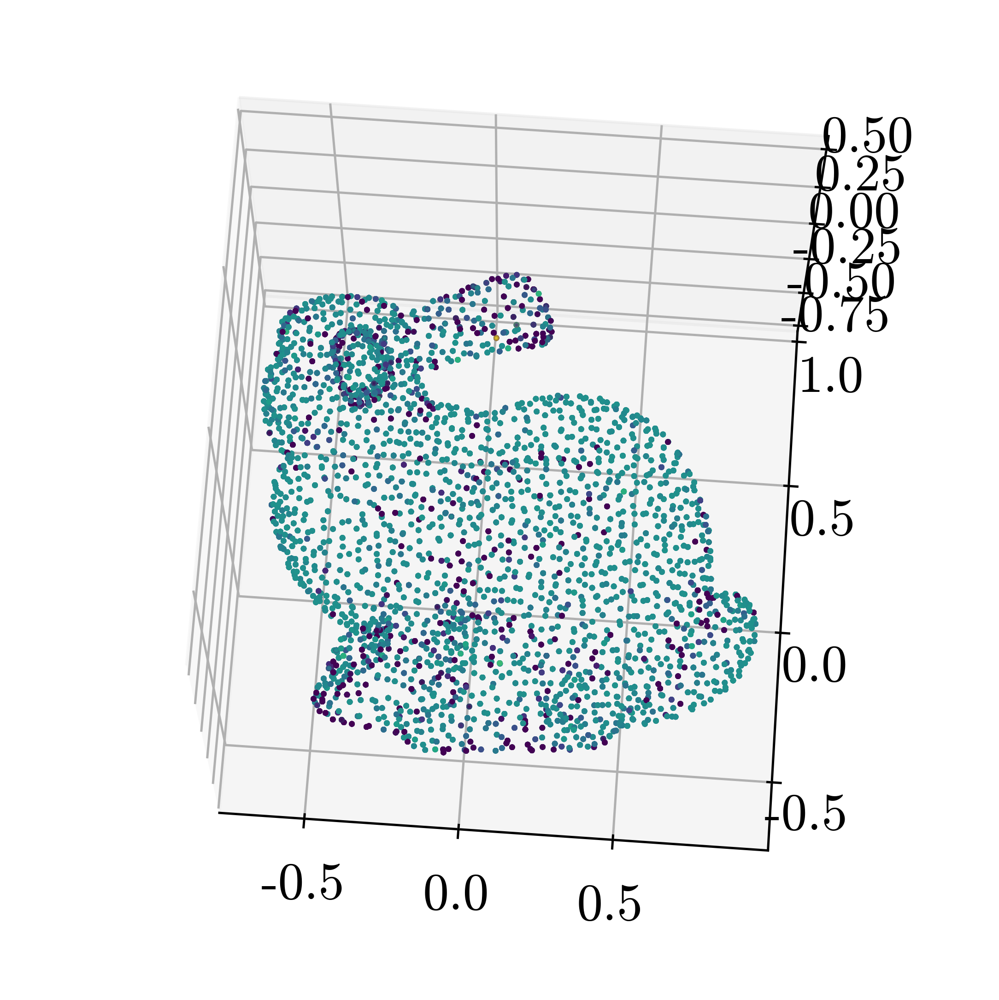

In [57]:
fig

In [23]:
k=2

In [24]:
ind_a, ind_b = np.where(np.triu(np.ones((k, k))))

In [25]:
ind_a, ind_b

(array([0, 0, 1]), array([0, 1, 1]))

In [26]:
a.shape

(4, 4)

In [60]:
ha = np.arange(0,4).reshape(2,2)

In [62]:
ha[np.triu_indices(2)].shape

(3,)

In [32]:
np.triu_indices(2)

(array([0, 0, 1]), array([0, 1, 1]))

In [74]:
test = np.arange(0,9).reshape(3,3)

In [75]:
ind_a, ind_b = np.triu_indices(3)

In [76]:
test[ind_a, ind_b] = np.array([111,222,333,444,555,666])

In [77]:
test

array([[111, 222, 333],
       [  3, 444, 555],
       [  6,   7, 666]])

In [78]:
test[ind_b, ind_a] = np.array([111,222,333,444,555,666])

In [79]:
test

array([[111, 222, 333],
       [222, 444, 555],
       [333, 555, 666]])

In [49]:
test

array([[111,   1,   2],
       [222, 333,   5],
       [444, 555, 666]])

In [51]:
test[np.triu_indices(3)] = np.array([111,222,333,444,555,666])

In [52]:
test

array([[111, 222, 333],
       [  3, 444, 555],
       [  6,   7, 666]])